In [2]:
from sectional_v2.util.plot.plot_maps import plot_map_diff, fix_axis4map_plot, plot_map_abs_abs_diff, plot_map, subplots_map, plot_map_diff_2case
from useful_scit.imps import (np, xr, plt, pd) 
from sectional_v2.util.imports import get_averaged_fields
from IPython.display import clear_output

# load and autoreload
from IPython import get_ipython

# noinspection PyBroadException
try:
    _ipython = get_ipython()
    _magic = _ipython.magic
    _magic('load_ext autoreload')
    _magic('autoreload 2')
except:
    pass

/home/ubuntu/mnts/nird/projects//Output_data_OAS-DEV/
/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/data_info/area_defs.csv
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Ideas:
- Root mean square diffence??
- Scatter plots of all values, e.g x-- sectional y-- non sectional color by lat/lev? Or lev lat difference. 

# Map plots number concentration:

In [13]:
model = 'NorESM'

startyear = '2008-01'
endyear = '2010-12'
p_level=1013.
pmin = 850.  # minimum pressure level
avg_over_lev = True  # True#True#False#True
pressure_adjust = True  # Can only be false if avg_over_lev false. Plots particular hybrid sigma lev
if avg_over_lev:
    pressure_adjust = True
p_levels = [1013.,900., 800., 700., 600.]  # used if not avg

In [4]:
from sectional_v2.constants import get_plotpath
from sectional_v2.util.practical_functions import make_folders
version='v21_both'
plot_path = get_plotpath('maps')
filen_base = plot_path+'/_%s'%version
#print(plot_path)
make_folders(plot_path)

## Cases

In [5]:
cases_sec = ['SECTv21_ctrl']
cases_orig =['noSECTv21_default_dd'] 
#cases_orig =['noSECTv21_ox_ricc']
to_case = 'SECTv21_ctrl'
from_cases = ['noSECTv21_default_dd','noSECTv21_ox_ricc_dd']
cases =[to_case]+from_cases
cases1=[from_cases[0], to_case]
cases2=[from_cases[1], to_case]
cases3 = from_cases

In [6]:
cases = cases_sec+cases_orig

In [7]:
from sectional_v2.constants import get_plotpath
from sectional_v2.util.practical_functions import make_folders

#plot_path = get_plotpath('maps')
#filen_base = plot_path+'/_%s'%version
#print(plot_path)
#make_folders(plot_path)

In [8]:
def load_and_plot(var, cases,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=None, relative=False):
    maps_dic = get_averaged_fields.get_maps_cases(cases,[var],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    clear_output()
    return plot_map_abs_abs_diff(var, cases, maps_dic, relative=relative, figsize=[18, 3], cbar_equal=True,
                          kwargs_abs={},
                          kwargs_diff={}, axs=None, cmap_abs='Reds', cmap_diff='RdBu_r')
    


In [9]:
def load_and_plot_rows(varl, cases,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=None, relative=False):
    maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    fig, axs = subplots_map(len(varl), 3, figsize=[18,3*len(varl)])
    ii=0
    for var in varl:
        axss= axs[ii,:]
        ii+=1
        plot_map_abs_abs_diff(var, cases, maps_dic, relative=relative, figsize=[18, 3], cbar_equal=True,
                          kwargs_abs={}, axs=axss,
                          kwargs_diff={}, cmap_abs='Reds', cmap_diff='RdBu_r')
    
    return axs

In [10]:
def load_and_plot_diff(varl, cases,startyear, endyear,
                       avg_over_lev=avg_over_lev,
                       pmin=pmin,nr_cols=2,
                       pressure_adjust=pressure_adjust, 
                       p_level=None, 
                       relative=False,
                      width=5.):
    maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    plot_diff(maps_dic, varl, cases,nr_cols=nr_cols, relative=relative, width=width)
    return


def plot_diff(maps_dic, varl, cases,nr_cols=2, relative=False, width=5., axs=None):
    #fig, axs = subplots_map(int(np.ceil(len(varl)/2)), 2, figsize=[10,4*len(varl)])
    if axs is None:
        nr_rows = int(np.ceil(len(varl)/nr_cols))
        print(nr_rows)
        fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,2.5*nr_rows])#7*nr_cols,3*nr_rows])
    for var, ax in zip(varl, axs.flatten()):
        plot_map_diff_2case(var,cases[0],cases[1], maps_dic, relative=relative, 
                               ax=ax, cmap_diff='RdBu_r')



In [11]:
def load_and_plot_diff_mm(varl,to_case,from_cases,startyear, endyear,
                       avg_over_lev=avg_over_lev,
                       pmin=pmin,nr_cols=2,
                       pressure_adjust=pressure_adjust, 
                       p_level=None, 
                       relative=False,
                      width=6.):
    cases = [to_case] + from_cases
    maps_dic = get_averaged_fields.get_maps_cases(cases,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
    nr_rows = int(np.ceil(len(varl)/nr_cols))
    nr_cols = len(from_cases)
    fig, axs = subplots_map(nr_rows, nr_cols, figsize=[width*nr_cols,2.5*nr_rows])
    for from_case,i in zip(from_cases,range(nr_cols)):
        sax = axs[:,i]
        plot_diff(maps_dic, varl, [from_case,to_case],nr_cols=nr_cols, relative=relative, width=width, axs=sax)
    return




## Mean to 850hPa weighted by pressure difference:

In [ ]:
var = 'N_AER'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

-74.41728464048941 -19.636411290819833
blues


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


-74.41728464048941 -19.636411290819833
blues


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


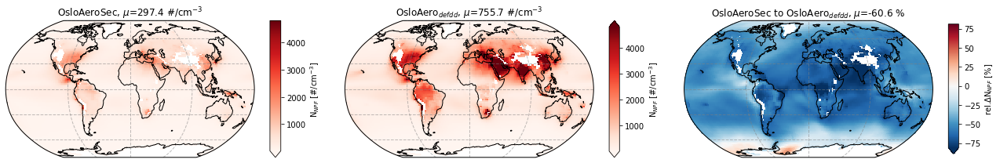

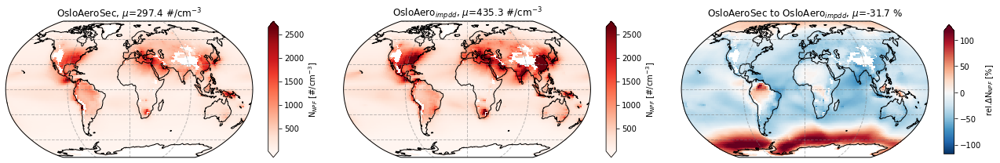

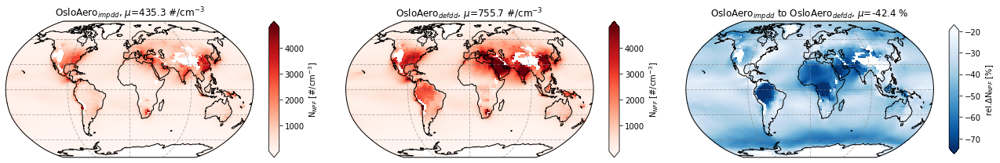

In [12]:
var = 'NCONC01'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

reds


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


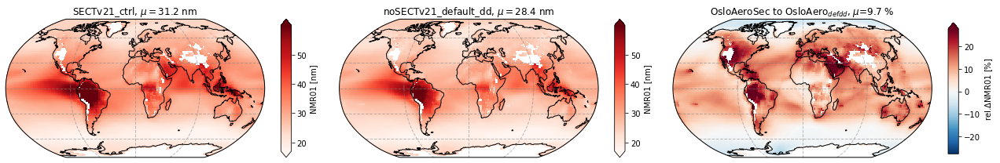

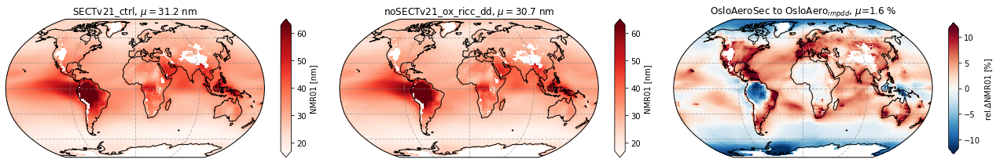

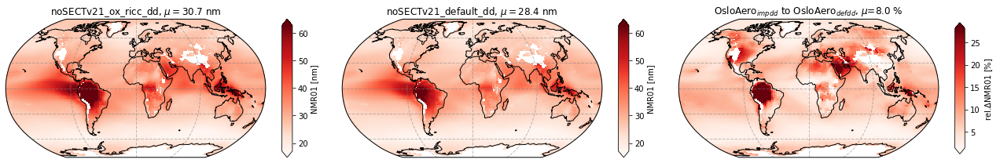

In [31]:
var = 'NMR01'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

In [ ]:
var = 'SOA_LV'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

-74.41728464048941 -19.636411290819833
blues


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


In [ ]:
var = 'H2SO4'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

-74.41728464048941 -19.636411290819833
blues


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


In [ ]:
var = 'cb_SOA_LV'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

-74.41728464048941 -19.636411290819833
blues


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


In [ ]:
var = 'cb_H2SO4'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

-74.41728464048941 -19.636411290819833
blues


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


-74.41728464048941 -19.636411290819833
blues


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


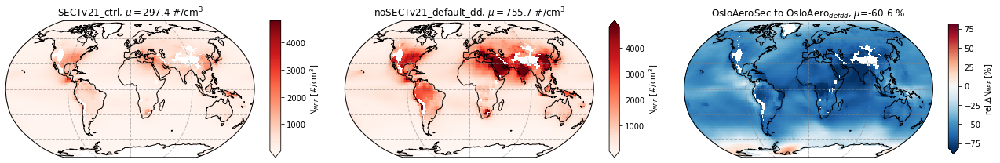

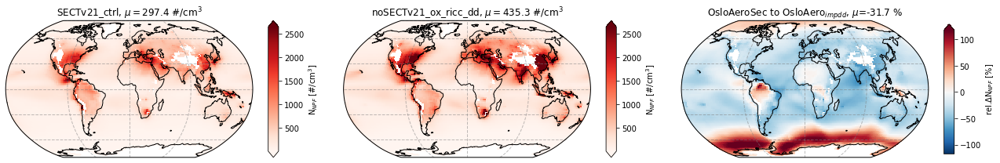

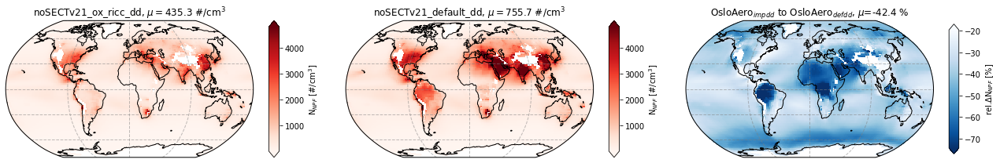

In [35]:
var = 'cb_SOA_NA'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

-74.41728464048941 -19.636411290819833
blues


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


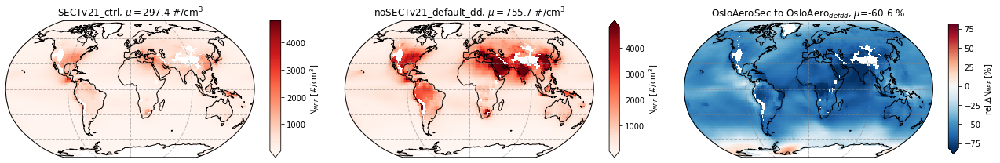

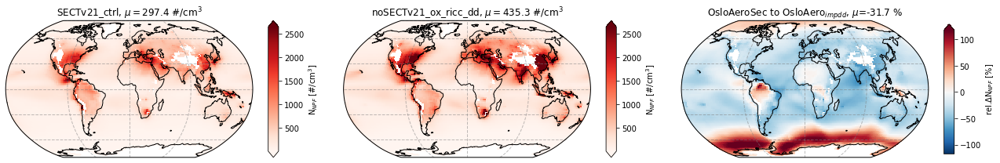

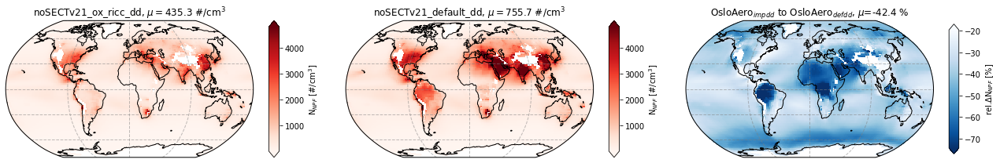

In [35]:
var = 'cb_SO4_NA'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

-74.41728464048941 -19.636411290819833
blues


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


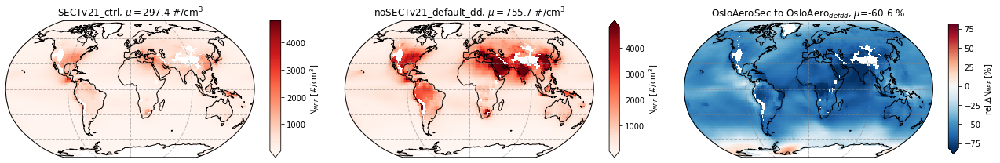

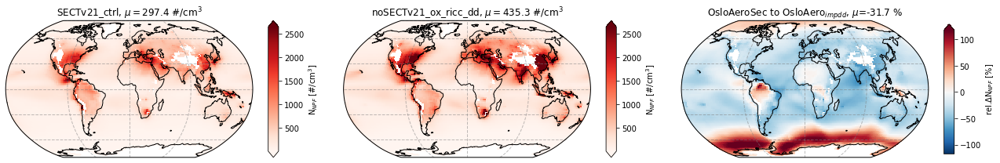

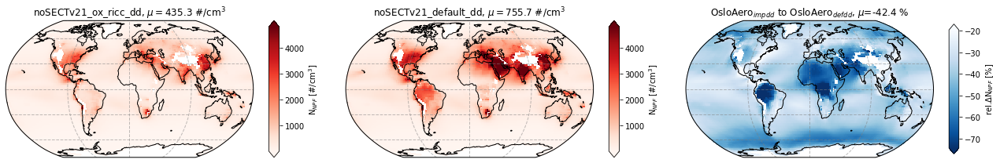

In [35]:
var = 'cb_SO4_A1'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

-74.41728464048941 -19.636411290819833
blues


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


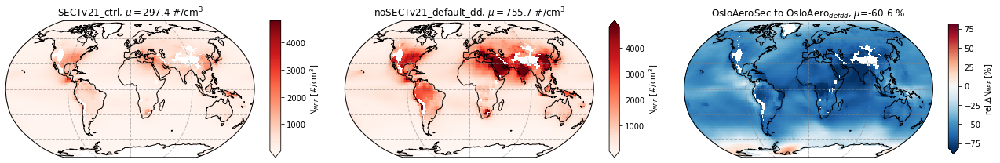

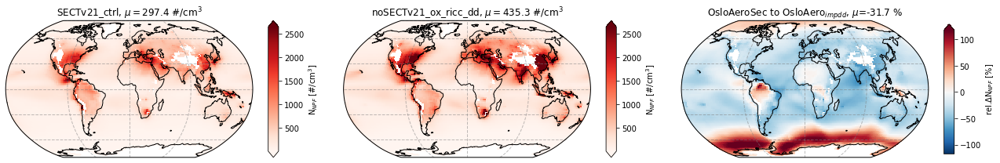

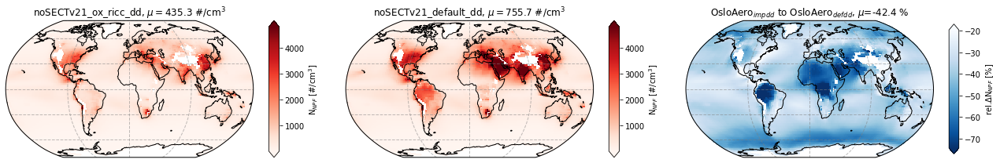

In [35]:
var = 'cb_SOA_A1'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

# SECTIONAL PARTICLES

Loading file /home/ubuntu/mnts/nird/projects//Output_data_OAS-DEV//means/map_means//NorESM/SECTv21_ctrl_koagD/nrSOA_SEC_tot_2008-01-2009-12_avg2lev850.nc


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


Loading file /home/ubuntu/mnts/nird/projects//Output_data_OAS-DEV//means/map_means//NorESM/SECTv21_ctrl_koagD/nrSO4_SEC_tot_2008-01-2009-12_avg2lev850.nc


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


Loading file /home/ubuntu/mnts/nird/projects//Output_data_OAS-DEV//means/map_means//NorESM/SECTv21_ctrl_koagD/nrSEC_tot_2008-01-2009-12_avg2lev850.nc


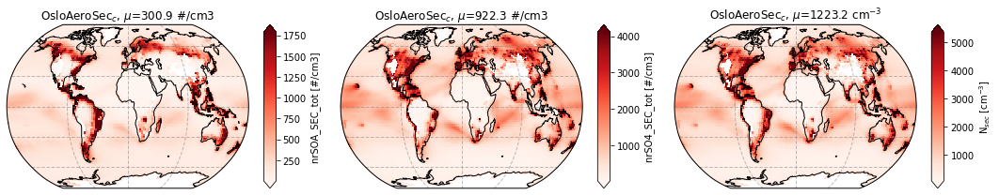

In [86]:
from sectional_v2.util.plot.plot_maps import subplots_map
varl= ['nrSOA_SEC_tot', 'nrSO4_SEC_tot','nrSEC_tot' ]
fig, axs = subplots_map(1, len(varl), figsize=[15,3])
for var, ax in zip(varl,axs):
    maps_dic = get_averaged_fields.get_maps_cases(cases_sec,[var],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust)

    plot_map(var, cases_sec[0], maps_dic,  figsize=[6, 3],
                          kwargs_abs={}, ax=ax, cmap_abs='Reds')
    
plt.show()

Loading file /home/ubuntu/mnts/nird/projects//Output_data_OAS-DEV//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_SEC01_2008-01-2009-12_lev_not_dim.nc


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


Loading file /home/ubuntu/mnts/nird/projects//Output_data_OAS-DEV//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_SEC02_2008-01-2009-12_lev_not_dim.nc


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:106: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


Loading file /home/ubuntu/mnts/nird/projects//Output_data_OAS-DEV//means/map_means//NorESM/SECTv21_ctrl_koagD/cb_SOA_SEC03_2008-01-2009-12_lev_not_dim.nc


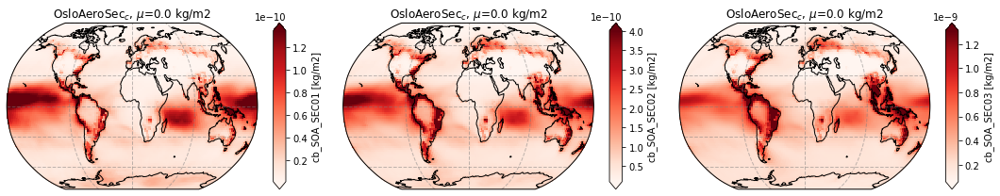

In [87]:
from sectional_v2.util.plot.plot_maps import subplots_map
varl= ['cb_SOA_SEC01', 'cb_SOA_SEC02','cb_SOA_SEC03' ]
fig, axs = subplots_map(1, len(varl), figsize=[15,3])
for var, ax in zip(varl,axs):
    maps_dic = get_averaged_fields.get_maps_cases(cases_sec,[var],startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust)

    plot_map(var, cases_sec[0], maps_dic,  figsize=[6, 3],
                          kwargs_abs={}, ax=ax, cmap_abs='Reds')
    
plt.show()

/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


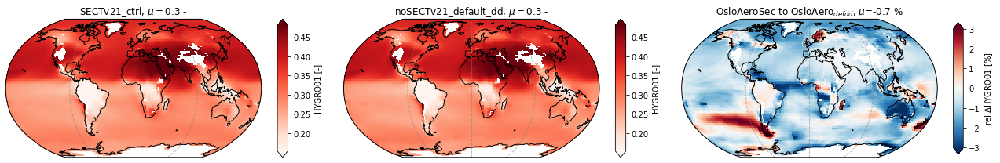

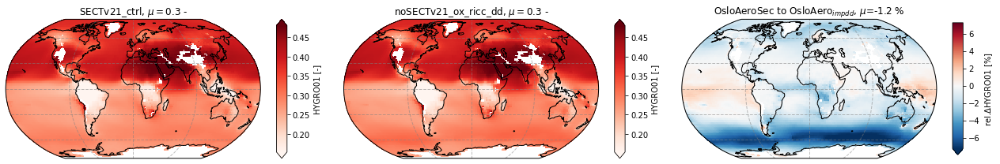

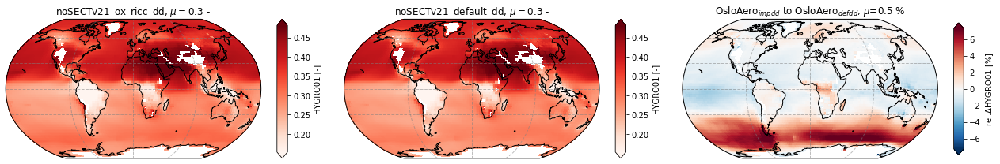

In [32]:
var = 'HYGRO01'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


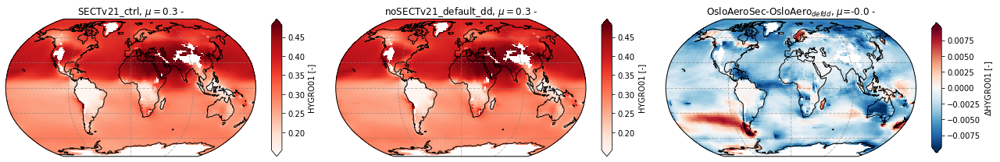

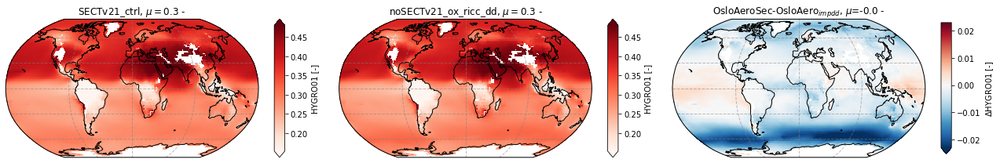

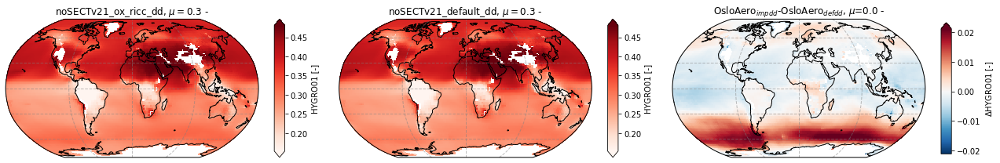

In [34]:
var = 'HYGRO01'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=False)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=False)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=False)

/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


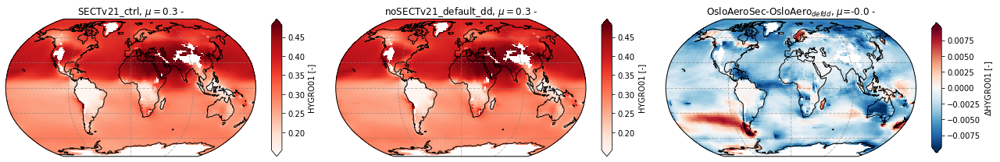

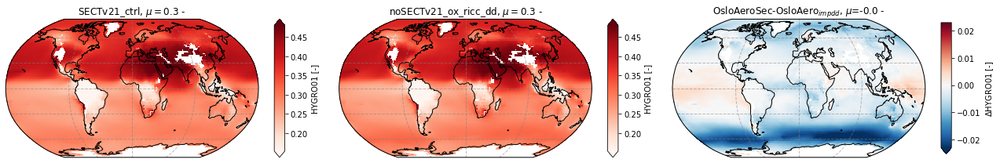

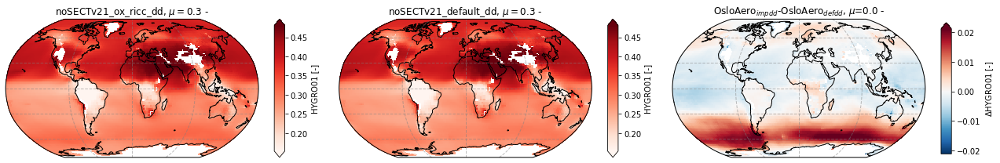

In [34]:
var = 'NUCLRATE'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=False)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=False)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=False)

/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


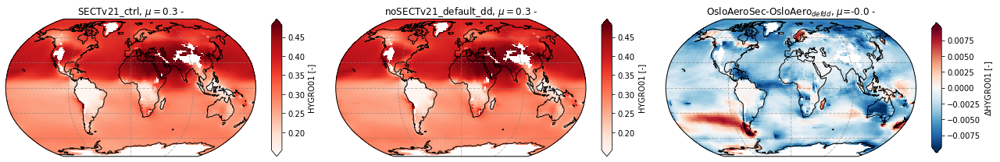

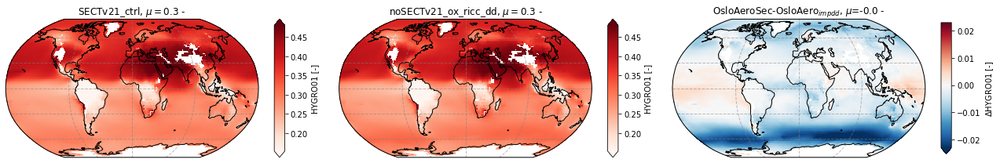

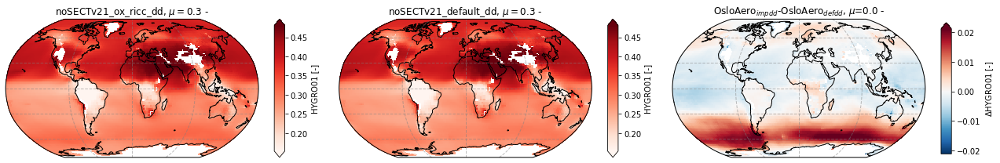

In [34]:
var = 'FORMRATE'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=False)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=False)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=False)

/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


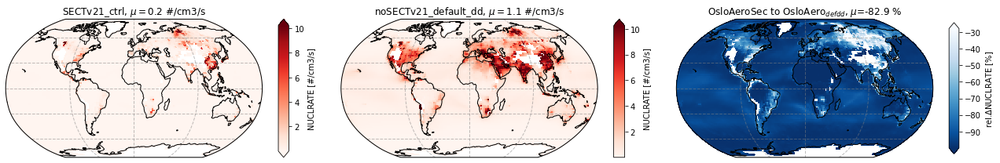

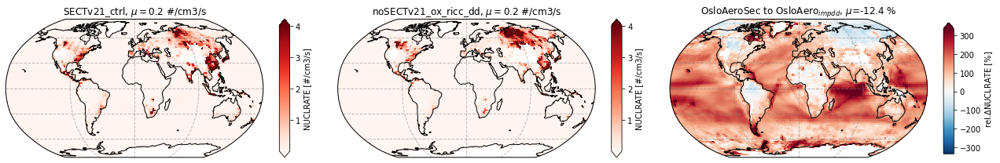

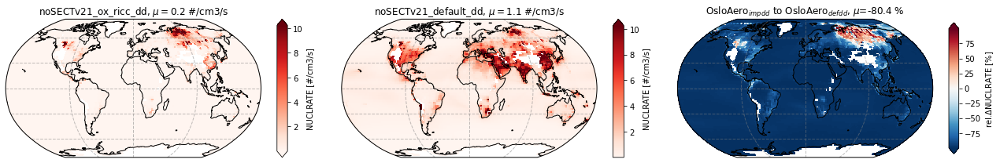

In [25]:
var = 'NUCLRATE'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


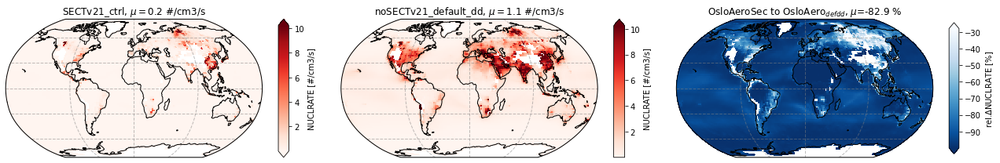

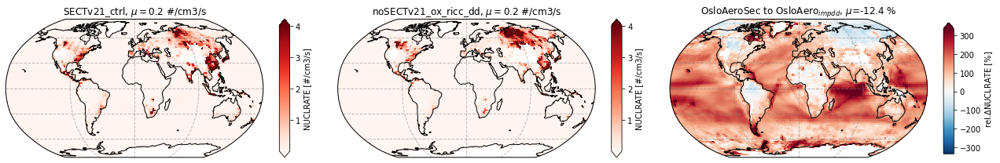

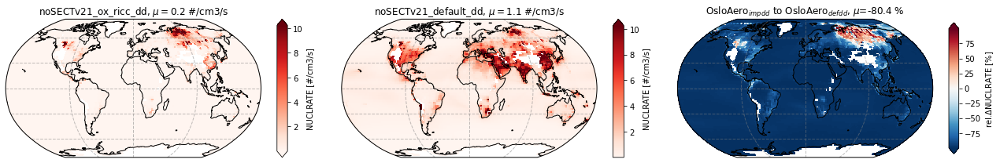

In [25]:
var = 'GR'
axs = load_and_plot(var, cases1, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases2, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)
axs = load_and_plot(var, cases3, startyear, endyear, avg_over_lev, pmin=pmin, pressure_adjust=pressure_adjust, relative=True)

Loading file /home/ubuntu/mnts/nird/projects//Output_data_OAS-DEV//means/map_means//NorESM/SECTv21_ctrl/leaveSecH2SO4_2008-01-2009-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_OAS-DEV//means/map_means//NorESM/SECTv21_ctrl/leaveSecSOA_2008-01-2009-12_avg2lev850.nc


/home/ubuntu/mnts/nird/projects/OAS-DEV/sectional_v2/util/plot/plot_maps.py:103: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


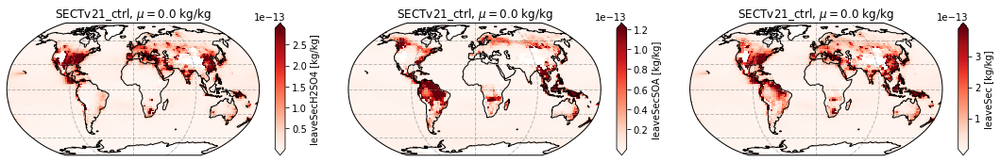

In [27]:
case=to_case
cases_s = [to_case]
var='leave'
varl=['leaveSecH2SO4','leaveSecSOA']
maps_dic = get_averaged_fields.get_maps_cases(cases_s,varl,startyear, endyear,
                                   avg_over_lev=avg_over_lev,
                                   pmin=pmin,
                                   pressure_adjust=pressure_adjust, p_level=p_level)
for case in cases_s:
    maps_dic[case]['leaveSec'] = maps_dic[case]['leaveSecH2SO4']+maps_dic[case]['leaveSecSOA']
    maps_dic[case]['leaveSec'].attrs['units'] = maps_dic[case]['leaveSecH2SO4'].attrs['units']
varl=varl+['leaveSec']
asp_rat=.5
width = 5
nr_rows=1
nr_cols=len(varl)

fig, axs = subplots_map(nr_rows,nr_cols, figsize=[nr_cols*width,nr_rows*width*asp_rat])
for var, ax in zip(varl, axs.flatten()):
    plot_map(var, case,maps_dic, figsize=None,
             kwargs_abs=None, ax=ax, cmap_abs='Reds', cbar_orientation='vertical')